In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
data = pd.read_csv('credit_risk_dataset.csv')

In [3]:
data.head(4)

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32581 entries, 0 to 32580
Data columns (total 12 columns):
person_age                    32581 non-null int64
person_income                 32581 non-null int64
person_home_ownership         32581 non-null object
person_emp_length             31686 non-null float64
loan_intent                   32581 non-null object
loan_grade                    32581 non-null object
loan_amnt                     32581 non-null int64
loan_int_rate                 29465 non-null float64
loan_status                   32581 non-null int64
loan_percent_income           32581 non-null float64
cb_person_default_on_file     32581 non-null object
cb_person_cred_hist_length    32581 non-null int64
dtypes: float64(3), int64(5), object(4)
memory usage: 3.0+ MB


In [5]:
data.describe()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
count,32581.000000,3.258100e+04,31686.000000,32581.000000,29465.000000,32581.000000,32581.000000,32581.000000
mean,27.734600,6.607485e+04,4.789686,9589.371106,11.011695,0.218164,0.170203,5.804211
std,6.348078,6.198312e+04,4.142630,6322.086646,3.240459,0.413006,0.106782,4.055001
min,20.000000,4.000000e+03,0.000000,500.000000,5.420000,0.000000,0.000000,2.000000
25%,23.000000,3.850000e+04,2.000000,5000.000000,7.900000,0.000000,0.090000,3.000000
50%,26.000000,5.500000e+04,4.000000,8000.000000,10.990000,0.000000,0.150000,4.000000
75%,30.000000,7.920000e+04,7.000000,12200.000000,13.470000,0.000000,0.230000,8.000000
max,144.000000,6.000000e+06,123.000000,35000.000000,23.220000,1.000000,0.830000,30.000000


In [6]:
# checking the percentage of the missing value
data.isnull().sum()/len(data) * 100

person_age                    0.000000
person_income                 0.000000
person_home_ownership         0.000000
person_emp_length             2.747000
loan_intent                   0.000000
loan_grade                    0.000000
loan_amnt                     0.000000
loan_int_rate                 9.563856
loan_status                   0.000000
loan_percent_income           0.000000
cb_person_default_on_file     0.000000
cb_person_cred_hist_length    0.000000
dtype: float64

In [7]:
# remove missing values
data.dropna(axis=0,inplace=True)

In [8]:
# age,person_emp_length have outliers
# outliers from variables age and employment length could negatively 
# affect our model and so should be removed
data.describe()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
count,28638.000000,2.863800e+04,28638.000000,28638.000000,28638.000000,28638.000000,28638.000000,28638.000000
mean,27.727216,6.664937e+04,4.788672,9656.493121,11.039867,0.216600,0.169488,5.793736
std,6.310441,6.235645e+04,4.154627,6329.683361,3.229372,0.411935,0.106393,4.038483
min,20.000000,4.000000e+03,0.000000,500.000000,5.420000,0.000000,0.000000,2.000000
25%,23.000000,3.948000e+04,2.000000,5000.000000,7.900000,0.000000,0.090000,3.000000
50%,26.000000,5.595600e+04,4.000000,8000.000000,10.990000,0.000000,0.150000,4.000000
75%,30.000000,8.000000e+04,7.000000,12500.000000,13.480000,0.000000,0.230000,8.000000
max,144.000000,6.000000e+06,123.000000,35000.000000,23.220000,1.000000,0.830000,30.000000


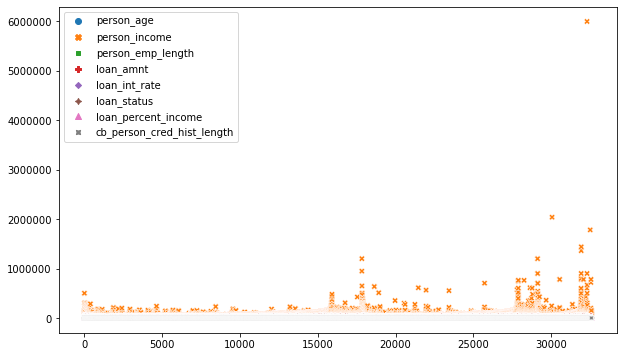

In [9]:
# use scatterplot to look for more outliers
plt.figure(figsize=(10,6))
sns.scatterplot(data = data)

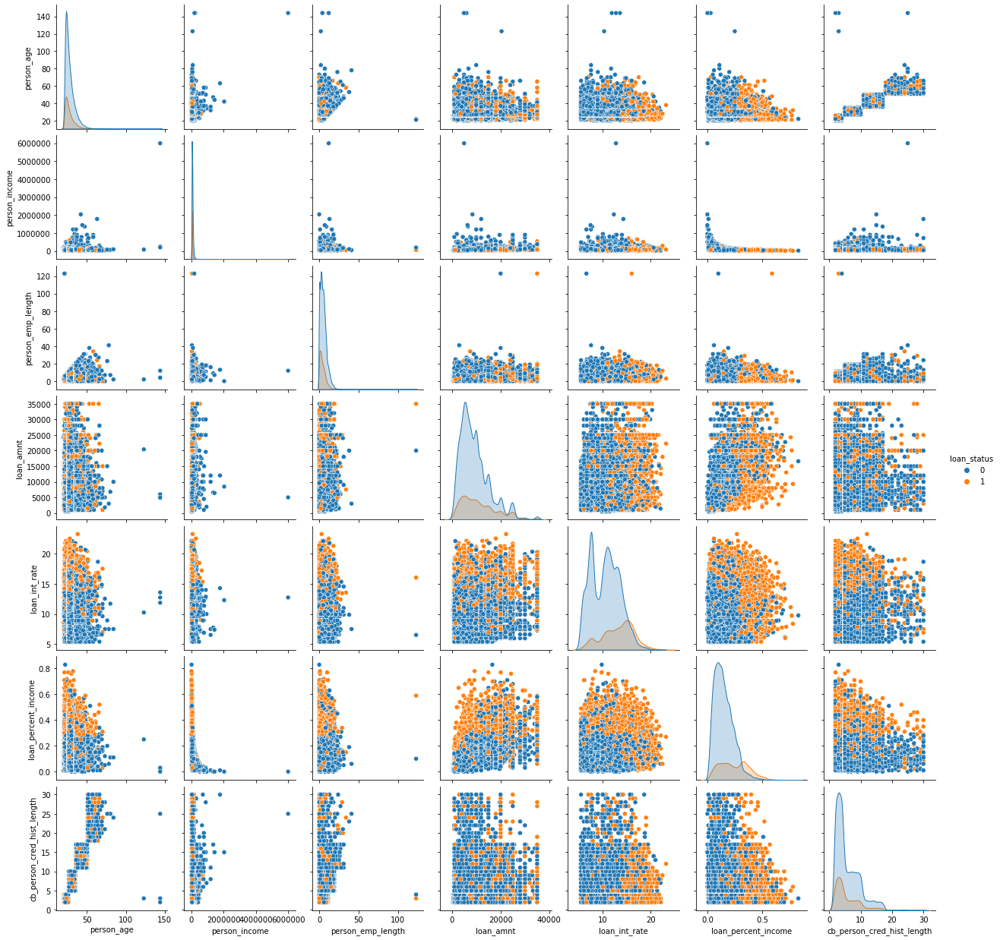

In [10]:
sns.pairplot(data=data,hue = 'loan_status')

In [11]:
import plotly.express as px
px.scatter_matrix(data,dimensions=["person_age","person_income",
                                   "person_emp_length","loan_amnt",
                                   "loan_int_rate"],
                 labels={col:col.replace('_',' ') for col in data.columns},
                 height = 900, color = 'loan_status')

In [12]:
# income also has outliners
# remove outliners
data = data[data['person_age']<=100]
data = data[data['person_income'] < max(data['person_income'])]
data = data[data['person_emp_length']<=100]

In [13]:
#Percentage of non-default cases
data_0 = data[data.loan_status == 0 ]
data_0.loan_status.count() / data.loan_status.count()

0.7833816492612902

In [14]:
px.box(data, x="loan_grade", y="loan_percent_income", color="loan_status",
      labels={col:col.replace('_', ' ') for col in data.columns})

In [15]:
#Parallel category diagram
px.parallel_categories(data,color = 'loan_status',dimensions=['person_home_ownership',
                                                            'loan_intent','loan_grade',
                                                            'cb_person_default_on_file'],
                      labels={col:col.replace('_',' ') for col in data.columns})

In [16]:
#One hot encoding of categorical variables
data = pd.get_dummies(data,columns=['person_home_ownership','loan_intent','loan_grade',
                             'cb_person_default_on_file'])

In [17]:
data.head(2)

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length,person_home_ownership_MORTGAGE,person_home_ownership_OTHER,...,loan_intent_VENTURE,loan_grade_A,loan_grade_B,loan_grade_C,loan_grade_D,loan_grade_E,loan_grade_F,loan_grade_G,cb_person_default_on_file_N,cb_person_default_on_file_Y
1,21,9600,5.0,1000,11.14,0,0.10,2,0,0,...,0,0,1,0,0,0,0,0,1,0
2,25,9600,1.0,5500,12.87,1,0.57,3,1,0,...,0,0,0,1,0,0,0,0,1,0


In [18]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.linear_model import LogisticRegression

### Logistic Regression

In [19]:
data1 = data

In [20]:
X = data1.drop('loan_status',axis=1)
y = data1['loan_status']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [21]:
# import warnings filter
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)

# import warnings filter
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)

In [22]:
logmodel = LogisticRegression()
logmodel.fit(X_train,y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [23]:
predictions = logmodel.predict(X_test)

In [24]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.82      0.98      0.89      6712
           1       0.80      0.23      0.36      1878

    accuracy                           0.82      8590
   macro avg       0.81      0.61      0.63      8590
weighted avg       0.82      0.82      0.78      8590



### KNN

### Standardize the Variables

In [25]:
from sklearn.preprocessing import StandardScaler

In [26]:
scaler = StandardScaler()

In [27]:
data2 = data

In [28]:
scaler.fit(data2.drop('loan_status',axis=1))

StandardScaler(copy=True, with_mean=True, with_std=True)

In [29]:
scaled_features = scaler.transform(data2.drop('loan_status',axis=1))

### Convert the scaled features to a dataframe and check the head of this dataframe to make sure the scaling worked.

In [30]:
data2.head(1)

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length,person_home_ownership_MORTGAGE,person_home_ownership_OTHER,...,loan_intent_VENTURE,loan_grade_A,loan_grade_B,loan_grade_C,loan_grade_D,loan_grade_E,loan_grade_F,loan_grade_G,cb_person_default_on_file_N,cb_person_default_on_file_Y
1,21,9600,5.0,1000,11.14,0,0.1,2,0,0,...,0,0,1,0,0,0,0,0,1,0


In [31]:
data_feat = pd.DataFrame(scaled_features,columns=data2.columns[:-1])
data_feat.head()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length,person_home_ownership_MORTGAGE,person_home_ownership_OTHER,...,loan_intent_PERSONAL,loan_intent_VENTURE,loan_grade_A,loan_grade_B,loan_grade_C,loan_grade_D,loan_grade_E,loan_grade_F,loan_grade_G,cb_person_default_on_file_N
0,-1.087538,-1.130386,0.054396,-1.367834,0.031071,-0.653415,-0.939671,-0.837189,-0.057393,3.472980,...,-0.459874,-0.699194,1.459251,-0.498351,-0.357652,-0.177028,-0.085752,-0.045442,0.465604,-0.465604
1,-0.439388,-1.130386,-0.936802,-0.656686,0.566775,3.765685,-0.691948,1.194474,-0.057393,-0.287937,...,-0.459874,-0.699194,-0.685283,2.006617,-0.357652,-0.177028,-0.085752,-0.045442,0.465604,-0.465604
2,-0.763463,-0.017080,-0.193403,4.005286,1.297560,3.389592,-0.939671,-0.837189,-0.057393,-0.287937,...,-0.459874,-0.699194,-0.685283,2.006617,-0.357652,-0.177028,-0.085752,-0.045442,0.465604,-0.465604
3,-0.601425,-0.238148,0.797795,4.005286,1.000291,3.577639,-0.444225,-0.837189,-0.057393,-0.287937,...,-0.459874,-0.699194,-0.685283,2.006617,-0.357652,-0.177028,-0.085752,-0.045442,-2.147748,2.147748
4,-1.087538,-1.124411,-0.689003,-1.130785,-1.207548,0.756936,-0.939671,-0.837189,-0.057393,3.472980,...,2.174509,1.430219,-0.685283,-0.498351,-0.357652,-0.177028,-0.085752,-0.045442,0.465604,-0.465604


In [32]:
# Use train_test_split to split your data into a training set and a testing set
X_train, X_test, y_train, y_test = train_test_split(scaled_features,data2['loan_status'],
                                                    test_size=0.30)

In [33]:
from sklearn.neighbors import KNeighborsClassifier

In [34]:
# Create a KNN model instance with n_neighbors=1
knn = KNeighborsClassifier(n_neighbors=1)

In [35]:
# Fit this KNN model to the training data.
knn.fit(X_train,y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=1, p=2,
                     weights='uniform')

In [36]:
# Use the predict method to predict values using your KNN model and X_test.
pred_knn = knn.predict(X_test)

In [37]:
print(confusion_matrix(y_test,pred_knn))

[[6173  564]
 [ 619 1234]]


In [38]:
print(classification_report(y_test,pred_knn))

              precision    recall  f1-score   support

           0       0.91      0.92      0.91      6737
           1       0.69      0.67      0.68      1853

    accuracy                           0.86      8590
   macro avg       0.80      0.79      0.79      8590
weighted avg       0.86      0.86      0.86      8590



In [39]:
import xgboost as xgb

In [40]:
data3 = data
X = data3.drop('loan_status',axis=1)
y = data3['loan_status']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [41]:
xg_reg = xgb.XGBRegressor(objective ='reg:linear', colsample_bytree = 0.3, learning_rate = 0.5,
                max_depth = 5, alpha = 10, n_estimators = 1000)

In [42]:
xg_reg.fit(X_train,y_train)

pred_xgb = xg_reg.predict(X_test)

[18:24:45] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.


In [47]:
from sklearn.metrics import mean_squared_error
rmse_xgb = np.sqrt(mean_squared_error(y_test, pred_xgb))
rmse_xgb

0.2679244716546249

In [48]:
print(confusion_matrix(y_test,pred_xgb.round()))

[[6676   36    0]
 [ 583 1272   23]
 [   0    0    0]]


In [43]:
print('Logistic Regression')
print(classification_report(y_test,predictions))
print('\n')
print('KNN')
print(classification_report(y_test,pred_knn))
print('\n')
print('XGBoost')
print(classification_report(y_test,pred_xgb.round()))

Logistic Regression
              precision    recall  f1-score   support

           0       0.82      0.98      0.89      6712
           1       0.80      0.23      0.36      1878

    accuracy                           0.82      8590
   macro avg       0.81      0.61      0.63      8590
weighted avg       0.82      0.82      0.78      8590



KNN
              precision    recall  f1-score   support

           0       0.78      0.79      0.78      6712
           1       0.21      0.20      0.21      1878

    accuracy                           0.66      8590
   macro avg       0.50      0.50      0.50      8590
weighted avg       0.66      0.66      0.66      8590



XGBoost
              precision    recall  f1-score   support

         0.0       0.92      0.99      0.95      6712
         1.0       0.97      0.68      0.80      1878
         2.0       0.00      0.00      0.00         0

    accuracy                           0.92      8590
   macro avg       0.63      0.56     

/home/nan/miniconda3/envs/selflearning/lib/python3.7/site-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.



In [44]:
data_dmatrix = xgb.DMatrix(data=X,label=y)

In [45]:
params = {"objective":"reg:linear",'colsample_bytree': 0.3,'learning_rate': 0.5,
                'max_depth': 5, 'alpha': 10}

cv_results = xgb.cv(dtrain=data_dmatrix, params=params, nfold=10,
                    num_boost_round=100,early_stopping_rounds=10,metrics="rmse", as_pandas=True, seed=101)

[18:25:26] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[18:25:26] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[18:25:26] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[18:25:26] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[18:25:26] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[18:25:27] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost

In [46]:
cv_results.head()

,train-rmse-mean,train-rmse-std,test-rmse-mean,test-rmse-std
0,0.420338,0.003540,0.420781,0.004395
1,0.380885,0.016947,0.381159,0.019372
2,0.363137,0.019101,0.363453,0.021063
3,0.346798,0.015892,0.347548,0.018176
4,0.338516,0.013679,0.339218,0.015583


In [47]:
# Extract and print the final boosting round metric
# RMSE didn't improve
print((cv_results["test-rmse-mean"]).tail(1))

99    0.280114
Name: test-rmse-mean, dtype: float64


In [48]:
xg_reg = xgb.train(params=params, dtrain=data_dmatrix, num_boost_round=10)

[18:25:35] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.


### We can see from the figure below that income, loan amount and loan interest rate are the top 3 most important features for predicting loan default and its probability.

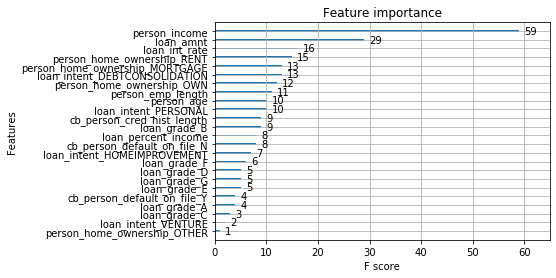

In [49]:
xgb.plot_importance(xg_reg)
plt.rcParams['figure.figsize'] = [10, 8]